# Dataset
The dataset used for this project consists of 2,684 labeled images across three categories: metal (769 images), paper (1,050 images), and plastic (865 images). The class distribution is slightly imbalanced, with paper having the most samples. The images feature varied backgrounds and lighting conditions, offering a realistic and challenging setting for training a robust classification model.

--------------------------------------------------------------------------------------------------------------------------------------------

This cell sets up the environment by importing all required libraries for the garbage classification task. These include:

* **Basic utilities**: os, random, pickle, warnings
* **Image processing**: cv2 (OpenCV)
* **Data handling & visualization**: numpy, pandas, matplotlib, seaborn
* **Deep learning (TensorFlow & Keras)**: Model layers, optimizers, callbacks, regularizers, and pre-trained networks (EfficientNetB0)
* **Scikit-learn**: Useful for data splitting, encoding, computing class weights, and evaluating models

In [ ]:
import os, cv2, random, pickle, warnings
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import tensorflow as tf
from keras.models import Model, load_model
from keras.layers import Dense, Dropout, GlobalAveragePooling2D, Input
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from keras.utils import to_categorical
from keras.regularizers import l2
from keras.applications import EfficientNetB0
from keras.applications.efficientnet import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix

warnings.filterwarnings("ignore")

--------------------------------------------------------------------------------------------------------------------------------------------

# Load and Inspect Dataset

The next cell defines two helper functions:

* **auto_crop_object:** Automatically detects the main object in an image (based on contours) and crops around it with optional padding. Useful for removing unnecessary background and focusing the model on the object of interest.

* **maybe_crop:** Introduces randomness to cropping. Acts as an augmentation strategy during training to add variability.

In [2]:
# --- Auto-cropping helper ---
def auto_crop_object(image, padding=40, min_crop_ratio=0.4):
    h_img, w_img = image.shape[:2]
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    _, thresh = cv2.threshold(blur, 60, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if not contours:
        return image

    c = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(c)
    x1 = max(x - padding, 0)
    y1 = max(y - padding, 0)
    x2 = min(x + w + padding, w_img)
    y2 = min(y + h + padding, h_img)
    crop_area = (x2 - x1) * (y2 - y1)
    if crop_area < (h_img * w_img * min_crop_ratio):
        return image

    return image[y1:y2, x1:x2]

# --- Optional cropping as augmentation ---
def maybe_crop(img, crop_prob=0.5, padding=40):
    if random.random() < crop_prob:
        return auto_crop_object(img, padding=padding)
    return img

In [ ]:
# --- Config ---
image_size = 224
batch_size = 128
initial_epochs = 20
fine_tune_epochs = 10
checkpoint_path = "best_efficientnetb0_garbage.keras"
base_path = "/Model/garbage_classification"
selected_labels = ["plastic", "paper", "metal"]

--------------------------------------------------------------------------------------------------------------------------------------------

The next cell iterates through selected class folders, loads images, optionally crops them using the maybe_crop function, resizes them, and stores them in a list X. It then converts images to RGB and applies EfficientNetB0 preprocessing. The labels are stored in y

In [4]:
# --- Load and maybe-crop dataset ---
X, y = [], []
for label in selected_labels:
    folder_path = os.path.join(base_path, label)
    for file in os.listdir(folder_path):
        img_path = os.path.join(folder_path, file)
        img = cv2.imread(img_path)
        if img is not None:
            img = maybe_crop(img, crop_prob=0.5, padding=40)
            resized = cv2.resize(img, (image_size, image_size))
            X.append(resized)
            y.append(label)

X = np.array(X)
X_rgb = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in X]
X = preprocess_input(X)
y = np.array(y)

--------------------------------------------------------------------------------------------------------------------------------------------

This cell transforms string labels into integer form using LabelEncoder and stores the encoder to disk for future decoding or inference use.

In [5]:
# --- Encode labels ---
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
num_classes = len(np.unique(y_encoded))

with open("label_encoder.pkl", "wb") as f:
    pickle.dump(label_encoder, f)

--------------------------------------------------------------------------------------------------------------------------------------------

This cell:
* Splits dataset into training and validation sets with stratification.
* Converts labels to one-hot encoded format.
* Initializes and fits a data augmentation generator to training data.

In [6]:
# --- Train-validation split ---
X_train, X_val, y_train, y_val = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)
y_train = to_categorical(y_train, num_classes)
y_val = to_categorical(y_val, num_classes)

# --- Data Augmentation ---
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=0.3,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)
datagen.fit(X_train)


--------------------------------------------------------------------------------------------------------------------------------------------

# Define and Train EfficientNetB0 Classifier

The next cell first addresses class imbalance using Scikit-learn’s compute_class_weight function, which calculates weights inversely proportional to class frequencies. Multiplying by 0.5 scales down their effect, which can be helpful to avoid overly penalizing the model during training.

Next, it defines the classification model using **EfficientNetB0** as the base feature extractor, pre-loaded with ImageNet weights. The top layers are removed (include_top=False) so custom classification layers can be added. The base is initially frozen (non-trainable) to retain its pre-trained knowledge during the first training phase.

**The new top architecture includes:**
* Global Average Pooling to reduce spatial dimensions.
* Dropout layers (50%) for regularization and to prevent overfitting.
* Dense layer with L2 regularization, adding complexity with controlled weight growth.
* Softmax output layer for multi-class classification.

This setup effectively combines a powerful feature extractor with a customizable head for fine-tuned garbage classification.

In [7]:
# --- Class weights (scaled) ---
class_weights_array = compute_class_weight(
    class_weight="balanced", classes=np.unique(y_encoded), y=y_encoded
)
scaled_class_weights = dict(enumerate(class_weights_array * 0.5))

# --- Build EfficientNetB0 Model ---
base_model = EfficientNetB0(include_top=False, weights='imagenet', input_tensor=Input(shape=(224, 224, 3)))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.01))(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


--------------------------------------------------------------------------------------------------------------------------------------------

The next cell prepares the model for training by compiling it with the **Adam optimizer** (a good balance between speed and accuracy) and categorical crossentropy (appropriate for multi-class problems). Accuracy is tracked as a metric.

**Three callbacks enhance the training process:**
* **EarlyStopping** halts training if validation loss doesn’t improve after 4 epochs, preventing overfitting.
* **ReduceLROnPlateau** decreases the learning rate when validation loss plateaus, helping the model refine further.
* **ModelCheckpoint** saves the best-performing model (based on validation accuracy).

The model is then trained using the augmented dataset from ImageDataGenerator. Training history shows a rapid improvement in both accuracy and loss, with validation accuracy reaching over 95%, a very strong result. The use of class weights likely helped balance learning across classes.

# Training Phase 01

In [8]:
# --- Compile model ---
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# --- Callbacks ---
early_stopping = EarlyStopping(monitor="val_loss", patience=4, restore_best_weights=True, verbose=1)
lr_reduce = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-6, verbose=1)
checkpoint = ModelCheckpoint(checkpoint_path, monitor="val_accuracy", save_best_only=True, verbose=1)

# --- Train (Phase 1: frozen base) ---
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=batch_size),
    validation_data=(X_val, y_val),
    epochs=initial_epochs,
    callbacks=[early_stopping, lr_reduce, checkpoint],
    class_weight=scaled_class_weights,
    verbose=1
)

Epoch 1/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4872 - loss: 2.6876   
Epoch 1: val_accuracy improved from -inf to 0.86034, saving model to best_efficientnetb0_garbage.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 90s 3s/step - accuracy: 0.4947 - loss: 2.6713 - val_accuracy: 0.8603 - val_loss: 1.9740 - learning_rate: 0.0010
Epoch 2/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 879ms/step - accuracy: 0.8095 - loss: 1.6657
Epoch 2: val_accuracy improved from 0.86034 to 0.91061, saving model to best_efficientnetb0_garbage.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 27s 944ms/step - accuracy: 0.8104 - loss: 1.6565 - val_accuracy: 0.9106 - val_loss: 1.2580 - learning_rate: 0.0010
Epoch 3/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 872ms/step - accuracy: 0.8474 - loss: 1.0785
Epoch 3: val_accuracy improved from 0.91061 to 0.91620, saving model to best_efficientnetb0_garbage.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 27s 936ms/step - accuracy: 0.8475 - loss: 1.0736 - val_accuracy: 0.9162 - val_loss: 0.8529 - learning_rate: 0.0010
Epoc

During the initial training phase with the base of the EfficientNetB0 model frozen, the model is trained to learn only from the newly added top layers. The training output reveals a rapid increase in both training and validation accuracy across epochs.
* The model **starts with a modest training accuracy of around 49%**, but quickly accelerates to over 87% by Epoch 5, showcasing the effectiveness of the pre-trained base combined with strong top-layer design.
  
* On the validation side, accuracy jumps significantly from **86% in the first epoch to over 94% by Epoch 5**, and ultimately reaches 95.16% by Epoch 18, which is indicative of strong generalization.

  
* **ModelCheckpoint is actively saving** the best-performing model on each epoch where validation accuracy improves, ensuring that the best model is retained.

  
* **EarlyStopping has not yet activated** at this stage, but it’s configured to monitor val_loss with a patience of 4, meaning it would stop if no improvement is seen over that span.

  
* **The learning rate** remains at **0.001** throughout this phase, as **ReduceLROnPlateau was not triggered**, which suggests that the validation loss continued to improve steadily.

These results strongly support that the initial training phase is very effective. The model learns a robust representation with only its classification head being updated, which is a textbook example of how transfer learning excels when data is limited or domain-specific.

--------------------------------------------------------------------------------------------------------------------------------------------

# Training Phase 02

In this phase, the model is fine-tuned by unfreezing the last **40 layers** of **EfficientNetB0** while keeping earlier layers frozen. This is a strategic move—early layers capture general features (edges, textures), while later layers learn task-specific patterns. Training the later layers helps the model adapt to the garbage classification task more precisely.

The learning rate is reduced drastically to **1e-5** to allow subtle weight adjustments without overwriting useful pretrained weights. Training again uses the same callbacks and class balancing.

The logs show that while training accuracy fluctuates slightly, validation accuracy stays consistently high, showing that the fine-tuning process improved model generalization without overfitting.

In [9]:
# --- Fine-tuning (Phase 2: unfreeze) ---
base_model.trainable = True
for layer in base_model.layers[:-40]:
    layer.trainable = False

model.compile(optimizer=Adam(learning_rate=1e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

fine_tune_history = model.fit(
    datagen.flow(X_train, y_train, batch_size=batch_size),
    validation_data=(X_val, y_val),
    epochs=fine_tune_epochs,
    callbacks=[early_stopping, lr_reduce],
    class_weight=scaled_class_weights,
    verbose=1
)

Epoch 1/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 74s 2s/step - accuracy: 0.8266 - loss: 0.3359 - val_accuracy: 0.9385 - val_loss: 0.2682 - learning_rate: 1.0000e-05
Epoch 2/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 27s 942ms/step - accuracy: 0.8657 - loss: 0.3049 - val_accuracy: 0.9367 - val_loss: 0.2699 - learning_rate: 1.0000e-05
Epoch 3/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 894ms/step - accuracy: 0.8497 - loss: 0.3156
Epoch 3: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-06.
17/17 ━━━━━━━━━━━━━━━━━━━━ 26s 926ms/step - accuracy: 0.8500 - loss: 0.3150 - val_accuracy: 0.9385 - val_loss: 0.2729 - learning_rate: 1.0000e-05
Epoch 4/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 27s 910ms/step - accuracy: 0.8713 - loss: 0.2918 - val_accuracy: 0.9385 - val_loss: 0.2783 - learning_rate: 5.0000e-06
Epoch 5/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 878ms/step - accuracy: 0.8801 - loss: 0.2751
Epoch 5: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-06.
17/17 ━━━━━━━━━━━━━━━━━━━━ 27s 911ms/step - accuracy: 0.8799 -

In the second phase, the previously frozen base of the **EfficientNetB0** is partially unfrozen (all but the first ~40 layers), allowing the model to refine lower-level features and adjust to the specifics of the garbage classification task. The training output in this phase shows a more modest level of improvement compared to the earlier phase but helps to further solidify performance.
* The **initial validation accuracy** starts high at **93.85%**, demonstrating that the previously learned features were already quite solid.
  
* **Throughout training, validation accuracy fluctuates only slightly**, hovering between 93% and 94.4%, showing stability and no signs of overfitting.

  
* As the model struggles to improve beyond that point, **ReduceLROnPlateau triggers twice** (after Epochs 3 and 5), dropping the learning rate from 1e-5 to 2.5e-6, helping the optimizer make finer updates.

  
* **EarlyStopping activates after Epoch 5**, as no substantial improvement in validation loss is seen. The model automatically restores the best weights from Epoch 1, when the highest validation accuracy was achieved during fine-tuning.

  
* Despite a slight dip in training accuracy in later epochs, the model maintains **strong validation performance**, a good indicator of generalizability.

This fine-tuning phase plays an important role in **polishing the model**. While the improvements are incremental, unfreezing later layers allows the model to adapt the feature extractor more precisely to the specific nuances of the dataset, such as lighting, background clutter, and object shapes that are common in garbage images.

--------------------------------------------------------------------------------------------------------------------------------------------

This cell loads the best saved model from disk if available, ensuring optimal weights are used for evaluation or inference.

In [10]:
# --- Load best model ---
if os.path.exists(checkpoint_path):
    model = load_model(checkpoint_path)
    print("✅ Best saved model loaded.")
else:
    print("⚠️ Using current model (checkpoint not found).")

✅ Best saved model loaded.


--------------------------------------------------------------------------------------------------------------------------------------------

# Evaluate Base Model Performance

This cell evaluates the trained model's performance on the validation set. It predicts the class probabilities for each image, converts those predictions to class labels, and compares them to the true labels. It then prints a detailed classification report showing metrics like precision, recall, and F1-score for each class. Finally, it visualizes the results using a confusion matrix, which highlights how often the model predicts each class correctly or confuses one class for another.

17/17 ━━━━━━━━━━━━━━━━━━━━ 11s 380ms/step

Classification Report:
              precision    recall  f1-score   support

       metal       0.74      0.99      0.85       154
       paper       0.96      0.93      0.94       210
     plastic       0.98      0.71      0.82       173

    accuracy                           0.88       537
   macro avg       0.89      0.88      0.87       537
weighted avg       0.90      0.88      0.88       537



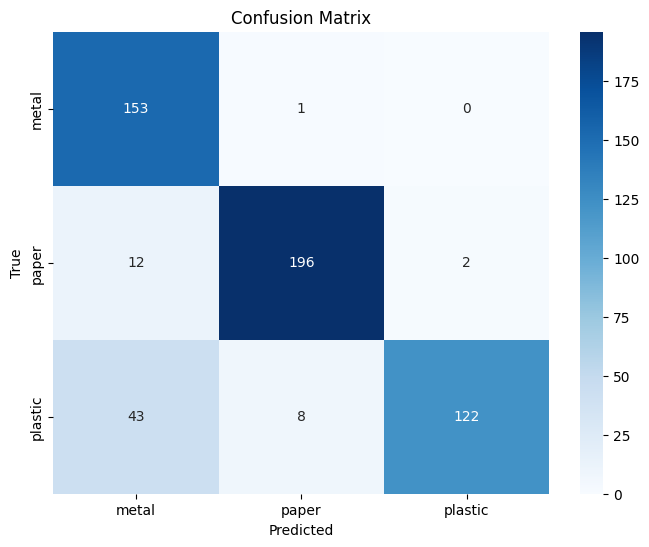

In [11]:
# --- Evaluate ---
y_val_pred = model.predict(X_val)
y_val_pred_labels = np.argmax(y_val_pred, axis=1)
y_val_true_labels = np.argmax(y_val, axis=1)

print("\nClassification Report:")
print(classification_report(y_val_true_labels, y_val_pred_labels, target_names=label_encoder.classes_))

cm = confusion_matrix(y_val_true_labels, y_val_pred_labels)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d",
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


This output shows the evaluation results of the model on the validation set, combining both quantitative metrics and a visual confusion matrix to give a clear picture of performance.

**Description:**
* The classification report indicates overall high precision and recall, especially for paper and plastic.
* **Metal**: Very high recall (0.99) means almost all metal samples were correctly identified, but the precision (0.74) is lower, suggesting some false positives.
* **Paper**: Balanced and strong across the board, with a 0.96 precision and 0.93 recall.
* **Plastic**: Excellent precision (0.98), but a lower recall (0.71) indicates the model sometimes misses plastic samples, misclassifying them (mostly as metal).

* **The overall accuracy is 88%**, which is strong, particularly in a multi-class setting involving visual data with potential overlap in textures and colors.

* The **confusion matrix** shows:
  * Almost perfect classification for metal and paper.
  * A significant number of plastic items (43) are misclassified as metal, likely contributing to metal’s lower precision and plastic’s lower recall.

--------------------------------------------------------------------------------------------------------------------------------------------

# Visualizing Predictions with Grad-CAM


In [22]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.applications.efficientnet import preprocess_input
from keras.models import Model

Loading the model:

In [ ]:
model_path = "/best_efficientnetb0_garbage.keras"
test_image_dir = "/testis4"
class_names = ["metal", "paper", "plastic"]
last_conv_layer_name = "top_conv"

# --- Load model ---
model = tf.keras.models.load_model(model_path)
print("✅ Model loaded")

✅ Model loaded


--------------------------------------------------------------------------------------------------------------------------------------------

This cell defines two helper functions for Grad-CAM visualization:

* **get_gradcam_overlay** generates a heatmap showing which parts of an image most influenced the model’s prediction, using gradients from a specified convolutional layer.

* **display_gradcam** overlays this heatmap on the original image to visually highlight the important regions.

These tools help interpret and explain the model's decisions.

In [24]:
# --- Grad-CAM helpers ---
def get_gradcam_overlay(model, img_array, layer_name, pred_index=None):
    grad_model = Model([model.inputs], [model.get_layer(layer_name).output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_output = predictions[:, pred_index]
    grads = tape.gradient(class_output, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def display_gradcam(img_rgb, heatmap, alpha=0.4):
    heatmap = cv2.resize(heatmap, (img_rgb.shape[1], img_rgb.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    colormap = plt.get_cmap("jet")
    heatmap_colored = colormap(heatmap)
    heatmap_colored = np.uint8(255 * heatmap_colored[..., :3])
    overlay = cv2.addWeighted(img_rgb, 1 - alpha, heatmap_colored, alpha, 0)
    return overlay

--------------------------------------------------------------------------------------------------------------------------------------------

Loading images from the dataset:

In [ ]:
model_path = "/kaggle/working/best_efficientnetb0_garbage.keras"
test_image_dir = "/kaggle/input/testis4"
class_names = ["metal", "paper", "plastic"]
last_conv_layer_name = "top_conv"

# --- Load images ---
image_paths = [os.path.join(test_image_dir, fname)
               for fname in os.listdir(test_image_dir)
               if fname.lower().endswith((".jpg", ".jpeg", ".png"))]
print(f"🖼 Found {len(image_paths)} images")

🖼 Found 13 images


--------------------------------------------------------------------------------------------------------------------------------------------

This cell displays predictions and Grad-CAM heatmaps for a set of images in a side-by-side grid. For each image, it shows:

* The original image along with the predicted class and confidence score.

* A Grad-CAM overlay that highlights the regions the model focused on to make its prediction.

This visualization is useful for interpreting model behavior and validating whether the predictions are based on meaningful image features.

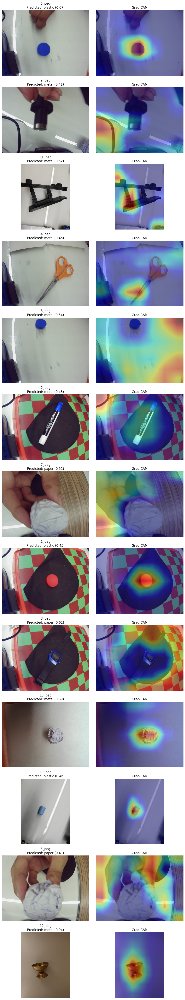

In [26]:
# --- Display all predictions + Grad-CAM in grid ---
num_images = len(image_paths)
cols = 2
rows = num_images
plt.figure(figsize=(10, 4 * rows))

for idx, image_path in enumerate(image_paths):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (224, 224))

    img_array = np.expand_dims(img_resized, axis=0)
    img_array = preprocess_input(img_array)

    preds = model.predict(img_array, verbose=0)
    class_idx = np.argmax(preds[0])
    class_label = class_names[class_idx]
    confidence = preds[0][class_idx]

    heatmap = get_gradcam_overlay(model, img_array, last_conv_layer_name, pred_index=class_idx)
    overlay = display_gradcam(img_rgb, heatmap)

    # Original + prediction
    plt.subplot(rows, cols, idx * cols + 1)
    plt.imshow(img_rgb)
    plt.title(f"{os.path.basename(image_path)}\nPredicted: {class_label} ({confidence:.2f})")
    plt.axis("off")

    # Grad-CAM overlay
    plt.subplot(rows, cols, idx * cols + 2)
    plt.imshow(overlay)
    plt.title("Grad-CAM")
    plt.axis("off")

plt.tight_layout()
plt.show()

This output showcases a grid of images alongside their corresponding Grad-CAM heatmaps, providing a visual explanation of the model’s predictions.

Each pair includes:

* The original image with the predicted class and confidence score.

* A Grad-CAM heatmap overlay that highlights the regions most influential in the model’s decision.

What it Shows:
    The model tends to focus on distinct and relevant object features (like a canister, lid, or ball), indicating that its predictions are generally informed and not arbitrary. However, some predictions are made with lower confidence scores (~0.4–0.5), which could signal uncertainty or misclassification—suggesting that these classes or samples might benefit from additional training data or tuning.
    The heatmaps also reveal that while many correctly emphasize the object itself, others are more dispersed or focus on surrounding areas, highlighting where the model’s attention may drift—valuable feedback for future improvements in data quality, augmentation, or architecture.



--------------------------------------------------------------------------------------------------------------------------------------------

# Improving Focus with YOLOv8

In [18]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.5/983.5 kB 27.3 MB/s eta 0:00:0000:01
Note: you may need to restart the kernel to use updated packages.


--------------------------------------------------------------------------------------------------------------------------------------------

This script integrates **YOLOv8** for object detection, **EfficientNetB0** for classification, and **Grad-CAM** for visual explanation to create a powerful, interpretable garbage classification pipeline. It is designed to detect objects in images, classify them into categories like metal, paper, or plastic, and visualize the model's reasoning through heatmaps.

Here's what the script does:

* **Loads pretrained models:** YOLOv8 detects objects in each image, while a fine-tuned EfficientNetB0 model classifies each detected region.

* **Processes images from a test directory**, filtering for standard image formats.

* **Detects objects using YOLOv8**, then crops and resizes those regions for classification.

* **Predicts the object class** and confidence using EfficientNetB0.

* G**enerates Grad-CAM heatmaps** to visually show where the classifier is focusing during prediction.

* **Displays side-by-side visualizations:** cropped object predictions with Grad-CAM overlays, and full images with bounding boxes and class labels.

This combination allows not just object classification, but also localized detection and transparent interpretability, making it ideal for quality-checking in automated waste management or real-world deployments where model understanding is key.

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 193MB/s]


✅ Models loaded
🖼 Found 13 images


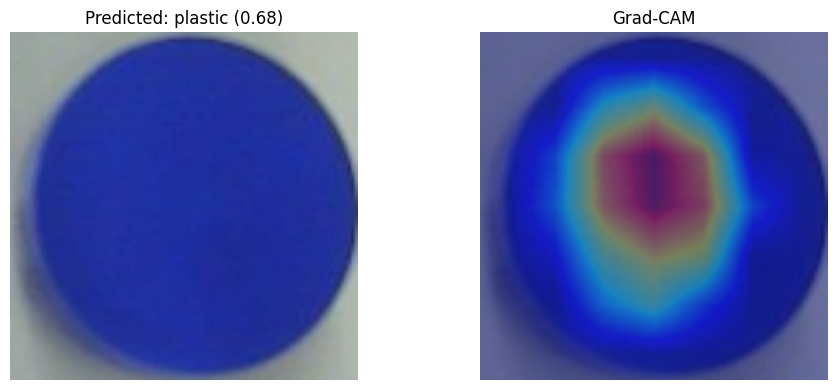

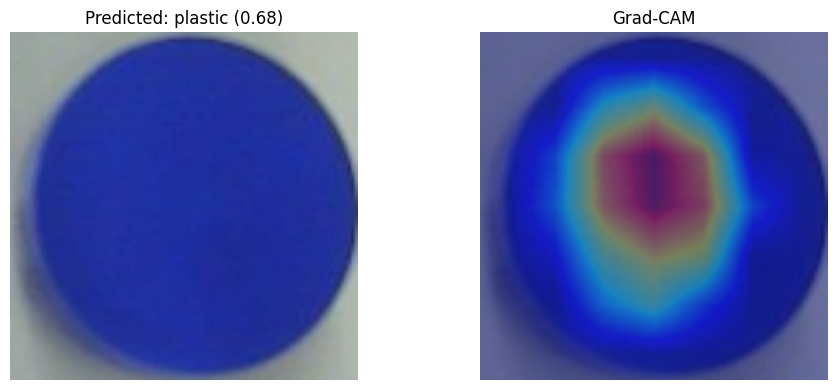

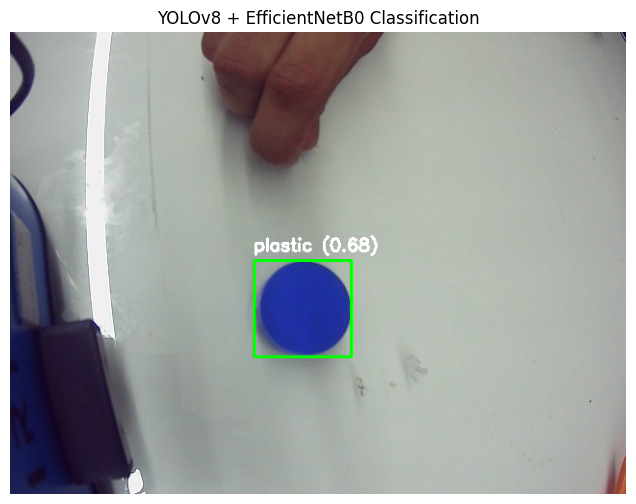

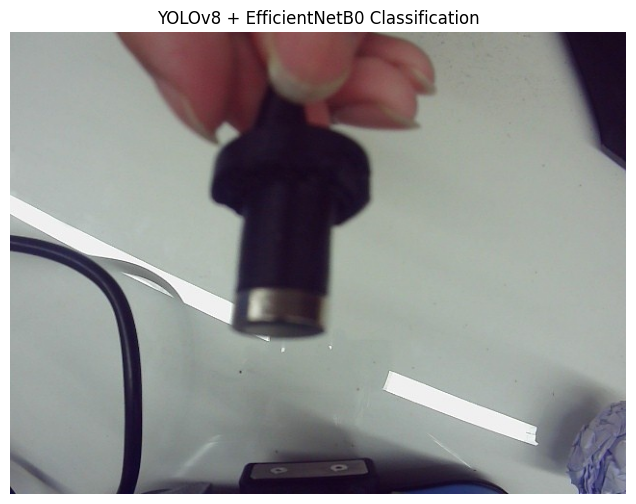

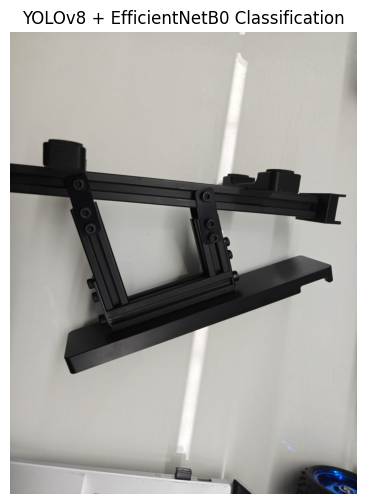

...

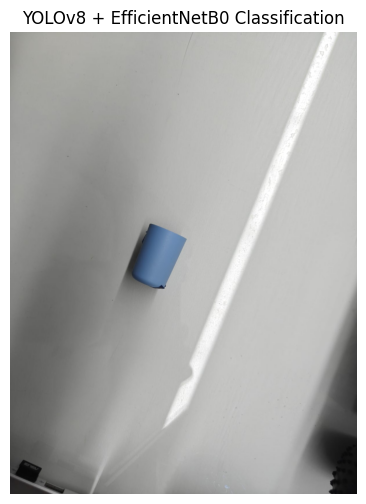

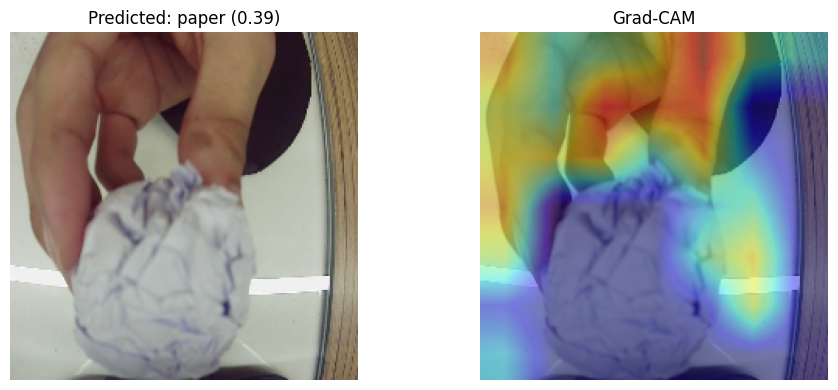

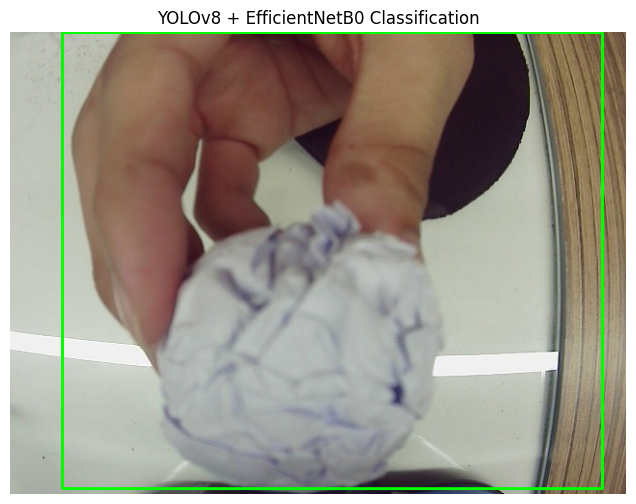

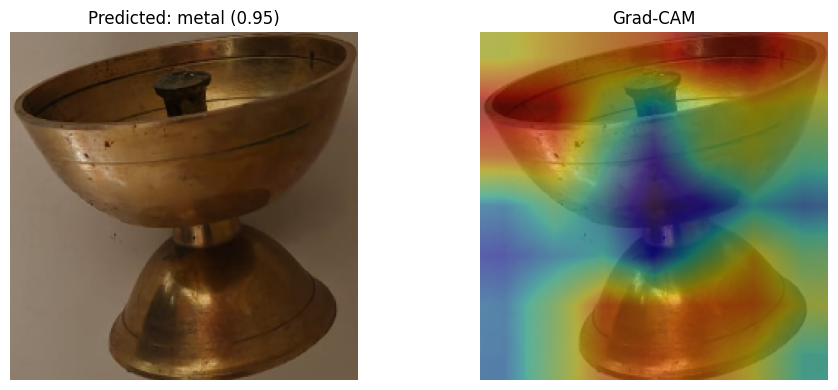

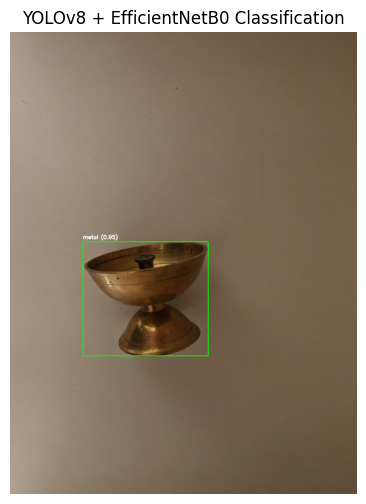

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.models import Model
from keras.applications.efficientnet import preprocess_input
from ultralytics import YOLO  # ⚠️ pip install ultralytics

# --- CONFIG ---
model_path = "/best_efficientnetb0_garbage.keras"
test_image_dir = "/Model/test"
class_names = ["metal", "paper", "plastic"]
last_conv_layer_name = "top_conv"

# --- Load models ---
model = tf.keras.models.load_model(model_path)
yolo = YOLO("yolov8n.pt")  # Use yolov8n, yolov8s or a fine-tuned garbage model
print("✅ Models loaded")

# --- Grad-CAM helpers ---
def get_gradcam_overlay(model, img_array, layer_name, pred_index=None):
    grad_model = Model([model.inputs], [model.get_layer(layer_name).output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_output = predictions[:, pred_index]
    grads = tape.gradient(class_output, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def display_gradcam(img_rgb, heatmap, alpha=0.4):
    heatmap = cv2.resize(heatmap, (img_rgb.shape[1], img_rgb.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    colormap = plt.get_cmap("jet")
    heatmap_colored = colormap(heatmap)
    heatmap_colored = np.uint8(255 * heatmap_colored[..., :3])
    overlay = cv2.addWeighted(img_rgb, 1 - alpha, heatmap_colored, alpha, 0)
    return overlay

# --- Process images ---
image_paths = [os.path.join(test_image_dir, fname)
               for fname in os.listdir(test_image_dir)
               if fname.lower().endswith((".jpg", ".jpeg", ".png"))]

print(f"🖼 Found {len(image_paths)} images")

for image_path in image_paths:
    orig = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)
    results = yolo.predict(source=img_rgb, conf=0.4, verbose=False)[0]

    # --- For each detected box ---
    for box in results.boxes.xyxy:
        x1, y1, x2, y2 = map(int, box.tolist())
        cropped = img_rgb[y1:y2, x1:x2]
        resized = cv2.resize(cropped, (224, 224))
        input_array = preprocess_input(np.expand_dims(resized, axis=0))

        preds = model.predict(input_array, verbose=0)
        class_idx = np.argmax(preds[0])
        class_label = class_names[class_idx]
        confidence = preds[0][class_idx]

        # --- Grad-CAM on cropped object ---
        heatmap = get_gradcam_overlay(model, input_array, last_conv_layer_name, pred_index=class_idx)
        overlay = display_gradcam(resized, heatmap)

        # --- Draw detection box and label on original ---
        cv2.rectangle(orig, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(orig, f"{class_label} ({confidence:.2f})", (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)

        # --- Show cropped + Grad-CAM ---
        plt.figure(figsize=(10, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(resized)
        plt.title(f"Predicted: {class_label} ({confidence:.2f})")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(overlay)
        plt.title("Grad-CAM")
        plt.axis("off")
        plt.tight_layout()
        plt.show()

    # --- Show full image with boxes + labels ---
    plt.figure(figsize=(12, 6))
    plt.imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB))
    plt.title("YOLOv8 + EfficientNetB0 Classification")
    plt.axis("off")
    plt.show()


As we can see, using YOLO improves the model's confidence and accuracy by removing background noise and allowing the classifier to focus on the object itself. This helps reduce misclassifications caused by distracting elements in the image. By isolating relevant regions, YOLO provides cleaner inputs that better represent the object classes.

The next step would be to integrate YOLO into the training process as well. This could help the model learn from focused regions from the start, potentially improving generalization. It would also open up opportunities for more consistent preprocessing, better data augmentation, and multi-object classification in a single image.

# Conclusion

We used **EfficientNetB0 to classify waste images** into metal, paper, and plastic. It performed well in clean scenarios, offering strong accuracy and efficiency. However, its performance dropped in cluttered images, where background noise misled the model and reduced confidence.

To address this, we incorporated **YOLOv8 for object detection**, cropping out the relevant regions before classification. This helped EfficientNetB0 focus on the actual object, improving both confidence and prediction accuracy.

**Going forward**, integrating YOLO into the training process could further improve generalization by allowing the model to learn from focused inputs from the start.